In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplsoccer import PyPizza
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r'q1_q82.csv', encoding='cp1252')
df.head()

,r.Nom.complet,r.Q01_Votre.statut,r.q2_Google,r.q2_Bing,r.q2_Qwant,r.q2_DuckDuckGo,r.q2_Startpage,r.q2_Ecosia,r.q2_Searx,r.q2_Autre,...,r.q78_ne_sais_pas,r.q79_Payant,r.q79_Perennite_Assuree,r.q79_Structure_Publique,r.q79_Intero,r.q79_Totalite_Contenu,r.q79_ne_sais_pas,r.q80_CV,r.q81_Photo,r.q82_Fichier
0,anonfirstname45 anonlastname45,1,-0.5,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0.0,0,0,0.0,0,1.0,0.5,1.00
1,anonfirstname31 anonlastname31,3,0.0,0.0,0.4,0.4,0.0,0.0,0.0,0,...,0,1,0.0,0,0,0.5,0,1.0,1.0,1.00
2,anonfirstname51 anonlastname51,1,-0.5,0.0,0.0,0.4,0.0,0.0,0.0,0,...,0,1,0.0,0,0,0.0,0,1.0,0.5,1.00
3,anonfirstname38 anonlastname38,1,-0.5,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0.0,0,0,0.0,0,1.0,0.5,1.00
4,anonfirstname42 anonlastname42,1,-0.5,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,1,0.0,0,0,0.5,0,1.0,0.5,-0.25


In [3]:
scoring = pd.DataFrame(columns = ['Nom.complet', "domaine_01", 
                                                 'domaine_02', 
                                                 'domaine_03', 
                                                 'domaine_04', 
                                                 'domaine_05'])
scoring['Nom.complet'] = df['r.Nom.complet']
scoring.head()

,Nom.complet,domaine_01,domaine_02,domaine_03,domaine_04,domaine_05
0,anonfirstname45 anonlastname45,NaN,NaN,NaN,NaN,NaN
1,anonfirstname31 anonlastname31,NaN,NaN,NaN,NaN,NaN
2,anonfirstname51 anonlastname51,NaN,NaN,NaN,NaN,NaN
3,anonfirstname38 anonlastname38,NaN,NaN,NaN,NaN,NaN
4,anonfirstname42 anonlastname42,NaN,NaN,NaN,NaN,NaN


## calculer les sommes des scores par domaines

| Les domaines |                                                  |  Score maximum  |   colonnes concernées  | Syntaxe python pour sélectionner les colonnes concernées |
|-------------:|:-------------------------------------------------|:---------------:|:----------------------:|:--------------:|
| Domaine 1    |Littération de l'information et des données       |       24,5      | les colonnes 1 à 56    |[1:57]  		  |
| Domaine 2    |Communication et collaboration                    |       18,5      | les colonnes 57 à 103  |[57:104]        |
| Domaine 3    |Création de contenu                               |       36        | les colonnes 104 à 162 |[104:163]		  |
| Domaine 4    |Sécurité                                          |     18,75       | les colonnes 163 à 180 |[163:181]		  |
| Domaine 5    |Environnement numérique et résolution de problèmes|     20,75       | les colonnes 181 à 213 |[181:214]		  |

Pour calculer la somme des scores du domaine 1 situé dans les colonnes 1 à 56, on peut selectionner ces colonnes en utilisant cette syntaxe : np.r_[1:57]. En Python, lorsque vous spécifiez une plage d'éléments en utilisant la syntaxe '[début:fin]', la fin de la plage (fin) n'est pas incluse dans la sélection. Par conséquent, pour sélectionner les colonnes 1 à 56, vous devez spécifier la plage [1:57]'. 

En cas d'ajout ou de suppression de questions, il y aura nécessairement un changement dans les colonnes. Il sera alors nécessaire de mettre à jour la syntaxe python pour sélectionner les colonnes concernées."

In [4]:
# Domaine 1 : sélectionner les colonnes 1 à 56
dom_01 = df.columns[np.r_[1:57]]
scoring["domaine_01"] = (df[dom_01].sum(axis=1) * 100 / 24.5).round(1)

# Domaine 2 : sélectionner les colonnes 57 à 103
dom_02 = df.columns[np.r_[57:104]]
scoring["domaine_02"] = (df[dom_02].sum(axis=1) * 100 / 18.5).round(1)

# Domaine 3 : sélectionner les colonnes 104 à 162
dom_03 = df.columns[np.r_[104:163]]
scoring['domaine_03'] = (df[dom_03].sum(axis=1) * 100 / 36).round(1)

# Domaine 4 : sélectionner les colonnes 163 à 180
dom_04 = df.columns[np.r_[163:181]]
scoring['domaine_04'] = (df[dom_04].sum(axis=1) * 100 / 18.75).round(1)

# Domaine 5 : sélectionner les colonnes 181 à 213
dom_05 = df.columns[np.r_[181:214]]
scoring['domaine_05'] = (df[dom_05].sum(axis=1) * 100 / 20.75).round(1)

scoring.head()

,Nom.complet,domaine_01,domaine_02,domaine_03,domaine_04,domaine_05
0,anonfirstname45 anonlastname45,33.5,10.8,38.2,26.7,61.4
1,anonfirstname31 anonlastname31,68.6,56.8,62.3,72.0,91.6
2,anonfirstname51 anonlastname51,44.5,37.8,34.5,56.0,53.0
3,anonfirstname38 anonlastname38,38.8,51.4,47.9,17.3,55.4
4,anonfirstname42 anonlastname42,53.3,67.6,92.1,66.7,84.3


#### En cas de changement
Le code ci-dessous imprime les noms des colonnes ainsi que leur numéro d'index dans la base de données. Il peut vous aider à retrouver les colonnes des questions en cas de changement. 

In [14]:
cols = df.columns
index = 0
for value in cols:
    print(index, value)
    index += 1

0 r.Nom.complet
1 r.Q01_Votre.statut
2 r.q2_Google
3 r.q2_Bing
4 r.q2_Qwant
5 r.q2_DuckDuckGo
6 r.q2_Startpage
7 r.q2_Ecosia
8 r.q2_Searx
9 r.q2_Autre
10 r.q3_Moteur_recherche2
11 r.q4_fournisseur_acces_internet
12 r.q4_localisation_geo
13 r.q4_type_appareil_utilise
14 r.q4_reglementation_niveau_local
15 r.q4_historique_recherche
16 r.q4_ne_sais_pas
17 r.q5_stockage1
18 r.q6_stockage2
19 r.q7_Google_drive
20 r.q7_Dropbox
21 r.q7_One_drive
22 r.q7_Autre
23 r.q7_Nextcloud
24 r.q8_synchro_donnees1
25 r.q9_synchro_donnees2
26 r.q10_synchro_donnees3
27 r.q11_Archives
28 r.q12_compression_fichier
29 r.q13_Veille_info
30 r.q14_abonnement_newsletters
31 r.q14_Notifications
32 r.q14_curation_outil
33 r.q14_Agregateur_contenus
34 r.q14_reseaux_sociaux
35 r.q14_autre
36 r.q15_nom_de_domaine
37 r.q15_suffixe
38 r.q15_protocole_https
39 r.q15_cadenas
40 r.q15_ne_sais_pas
41 r.q16_diffusion_info
42 r.q17_vitesse_ordinateur
43 r.q17_donnees_en_entre
44 r.q17_duree_traitement
45 r.q17_ne_sais_pas
46 r

## Graphique

posx and posy should be finite values
posx and posy should be finite values


J'ai terminé


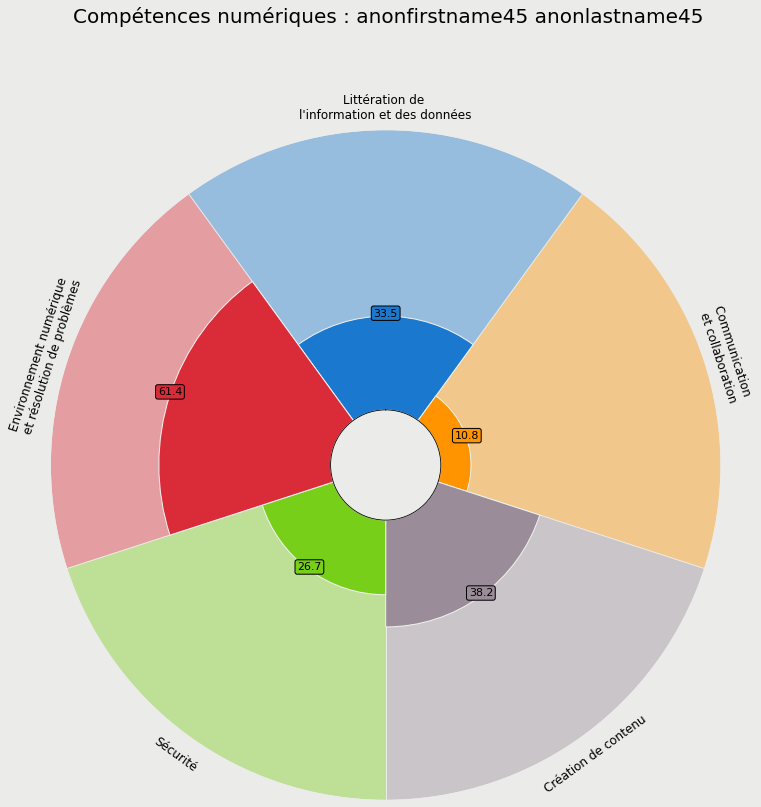

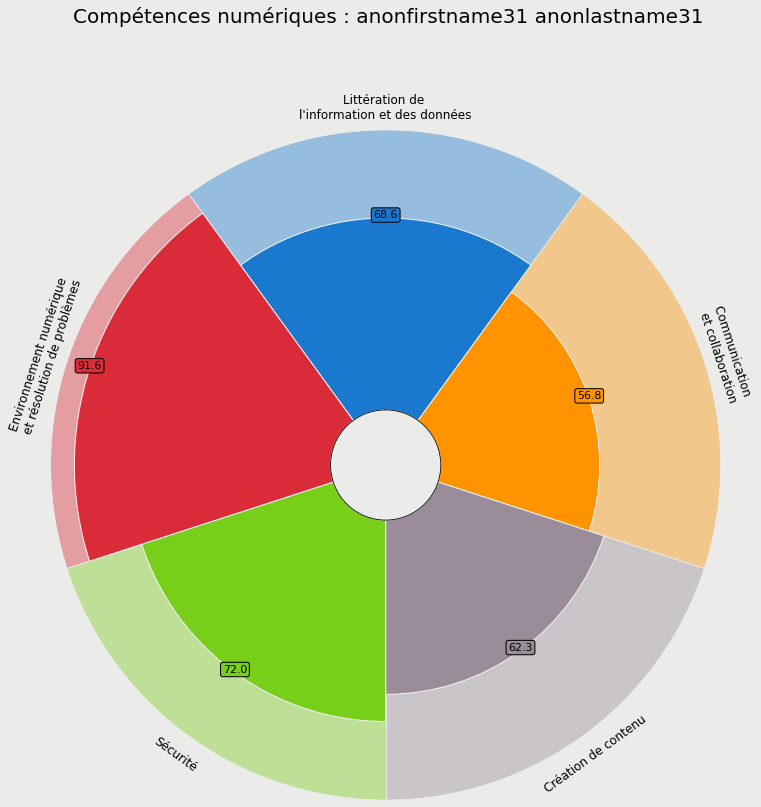

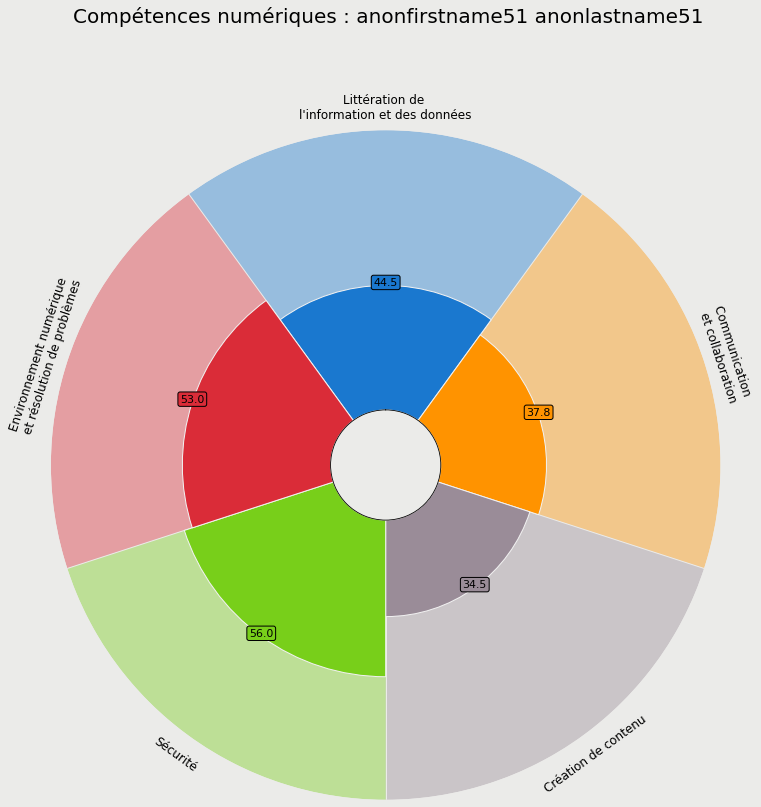

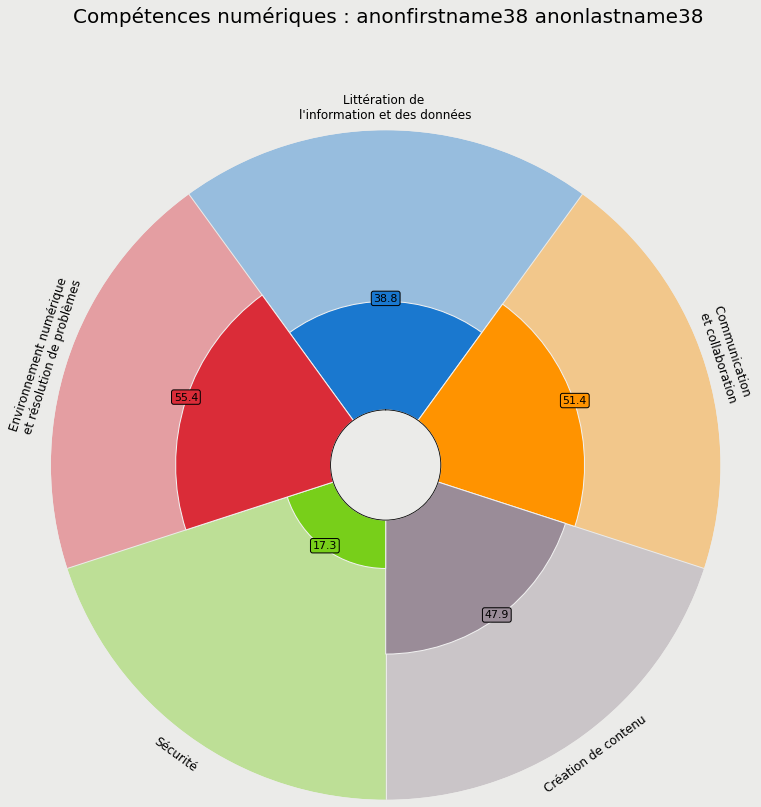

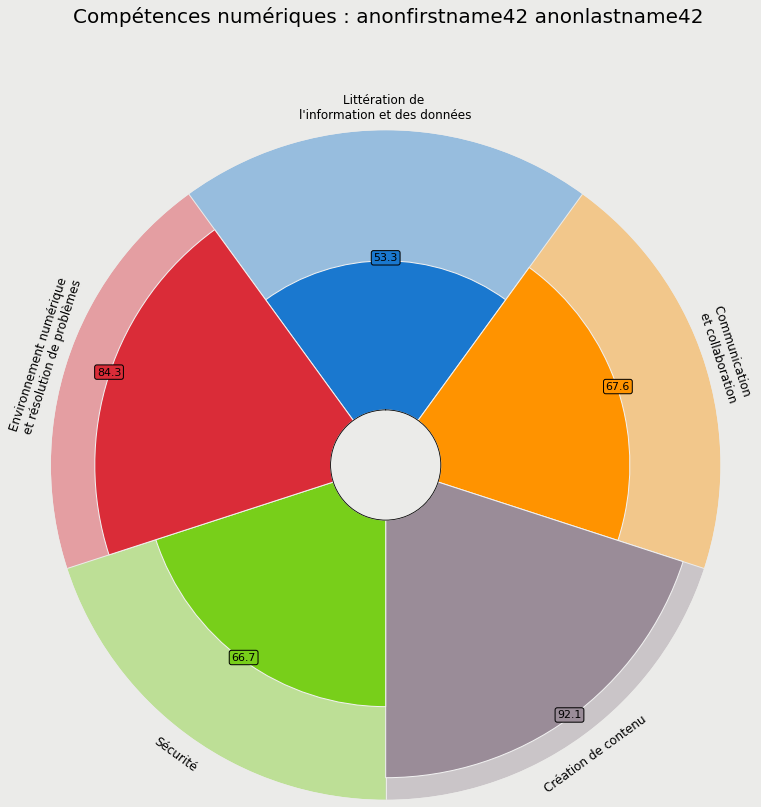

...

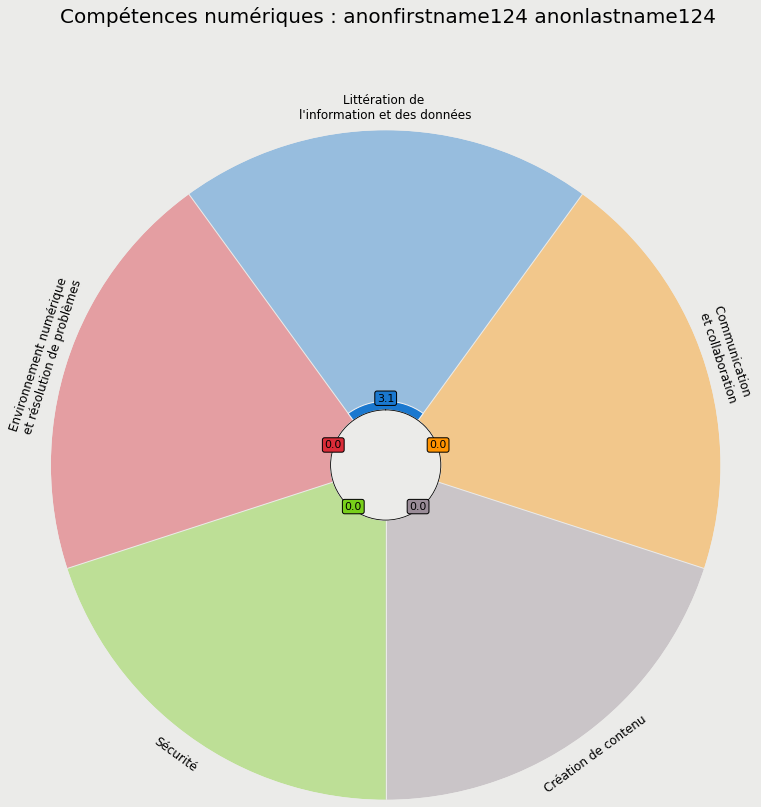

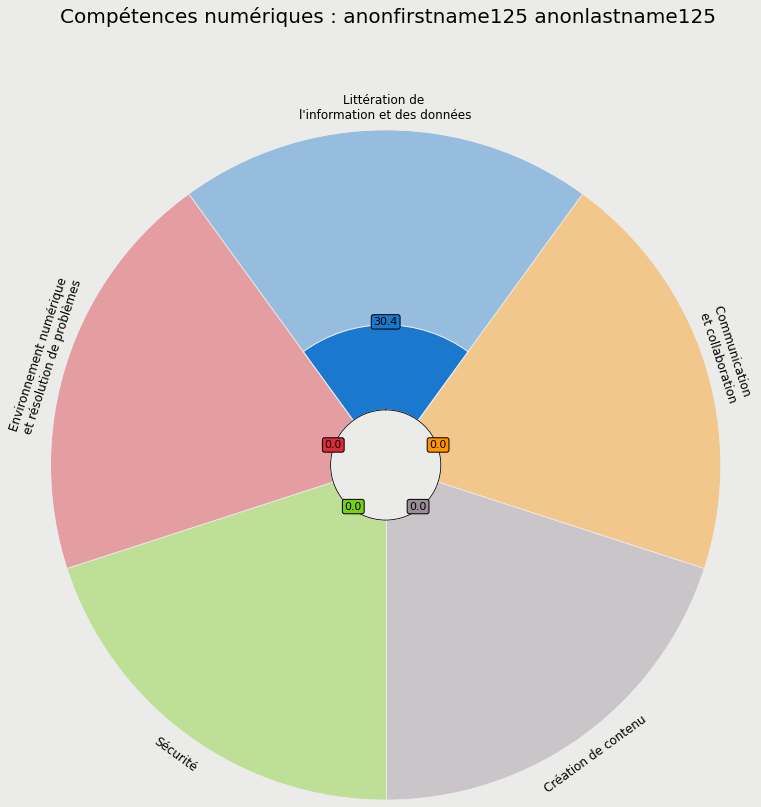

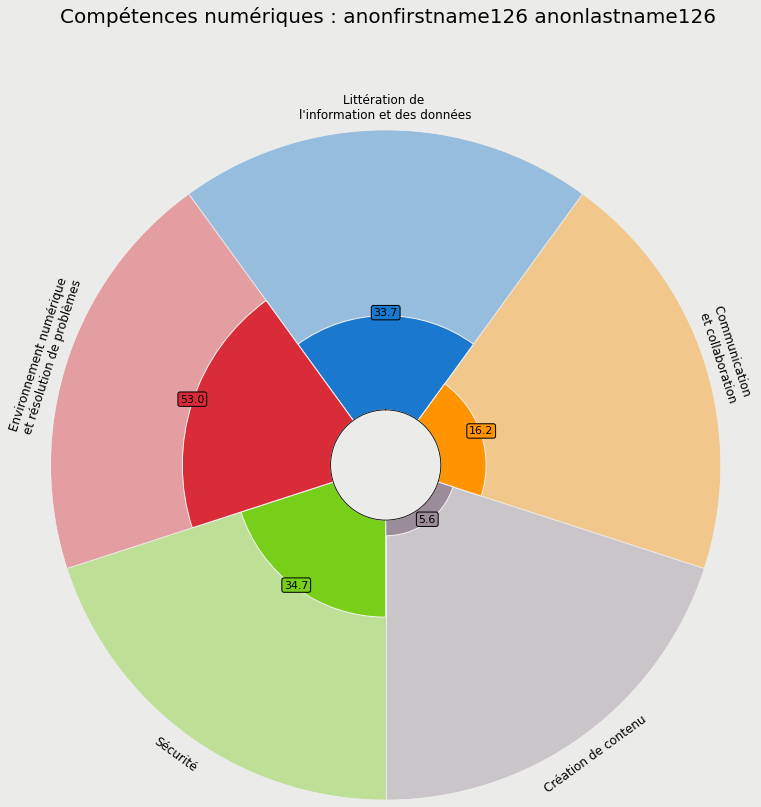

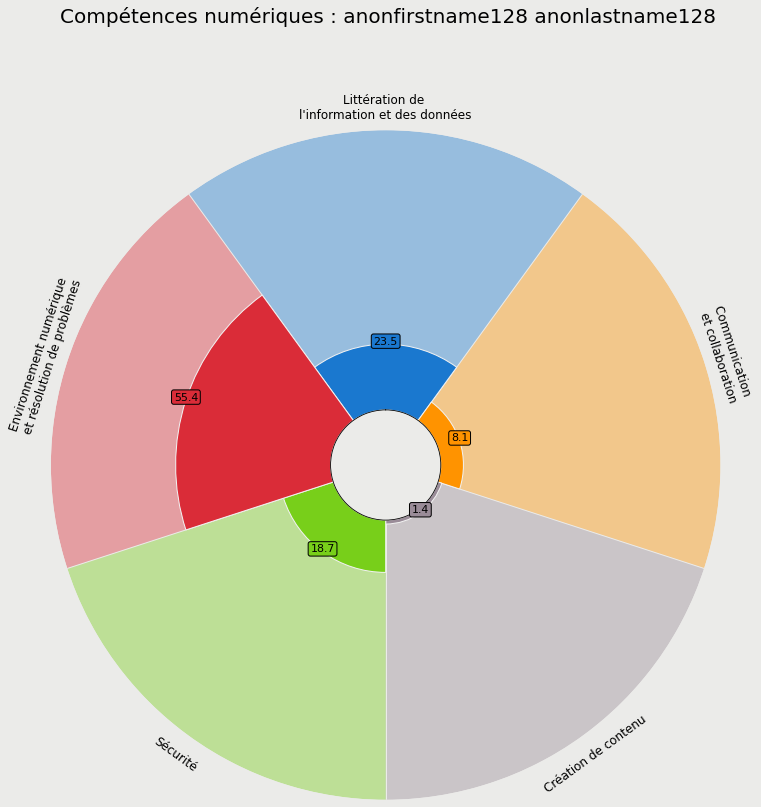

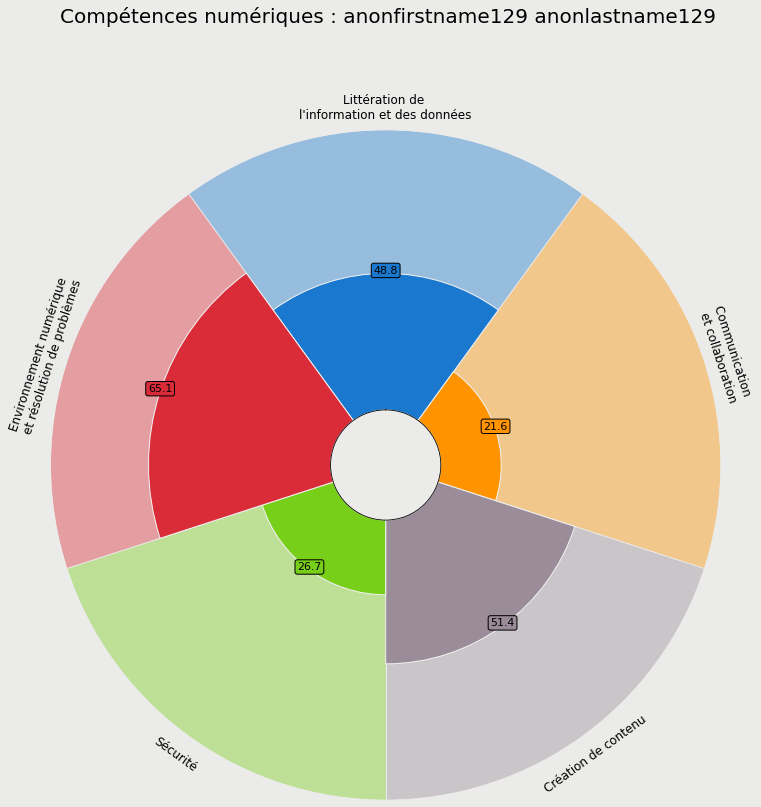

posx and posy should be finite values
posx and posy should be finite values


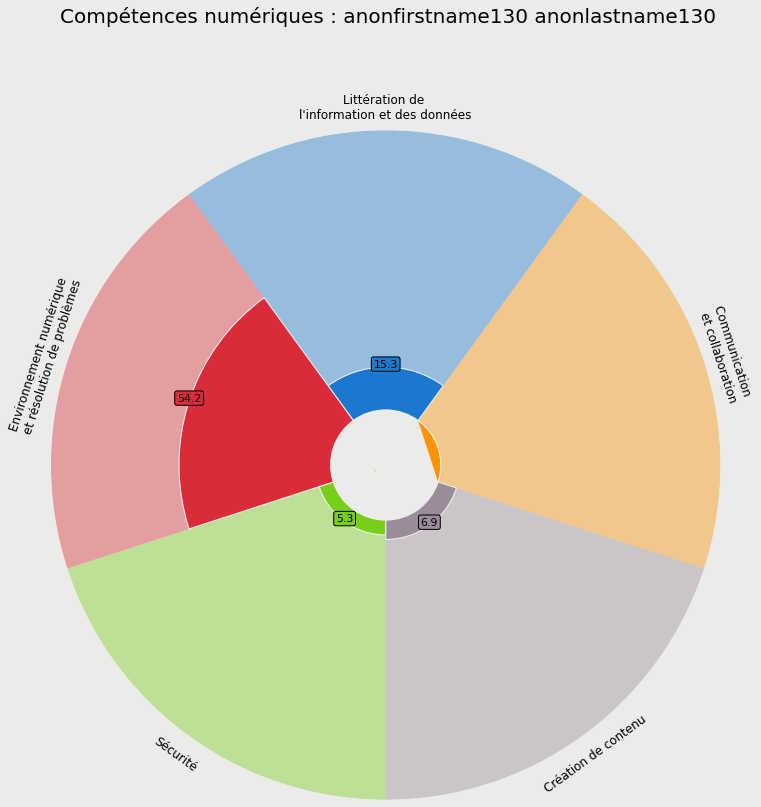

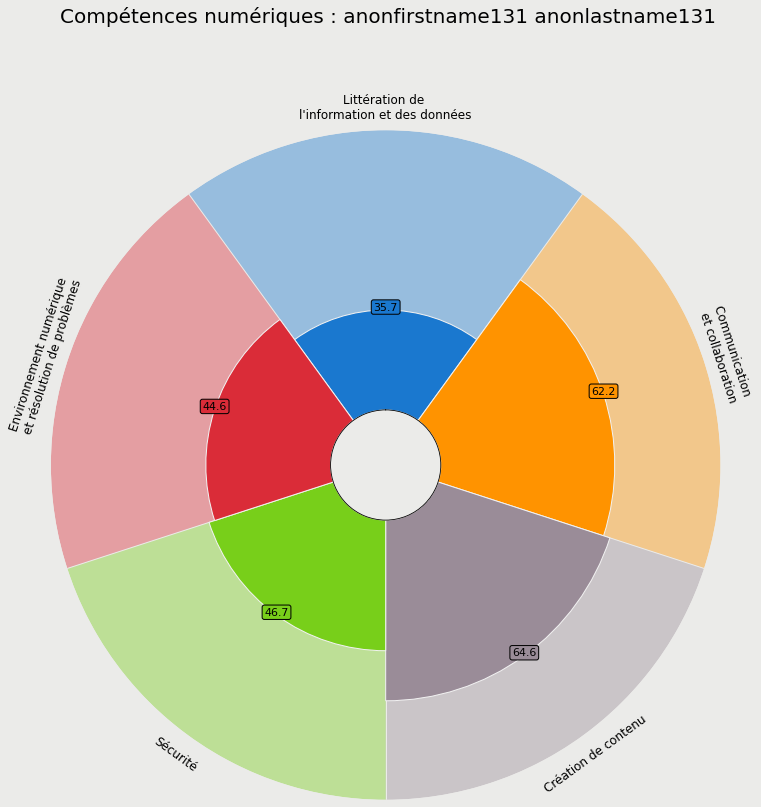

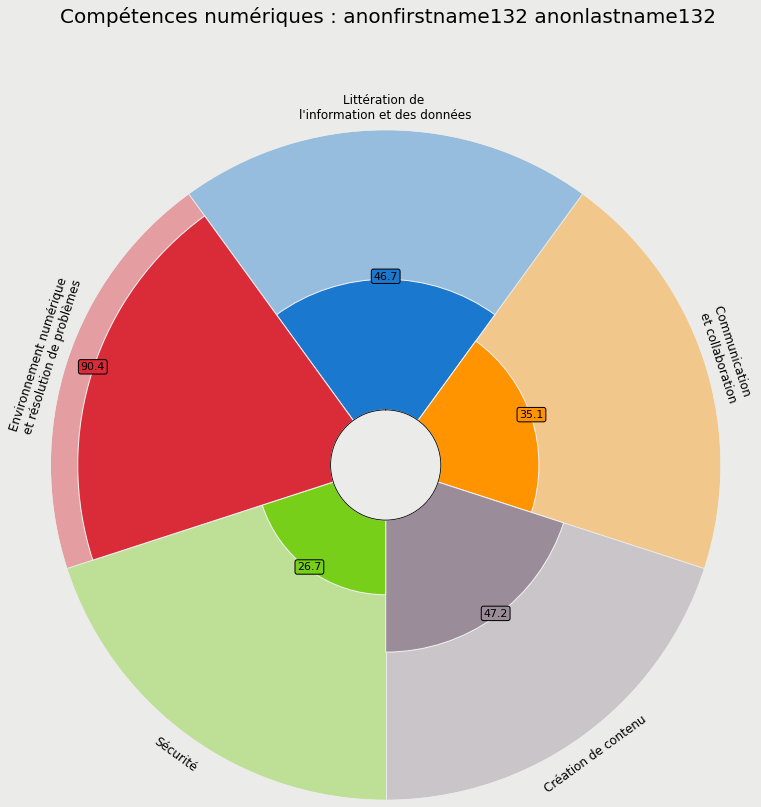

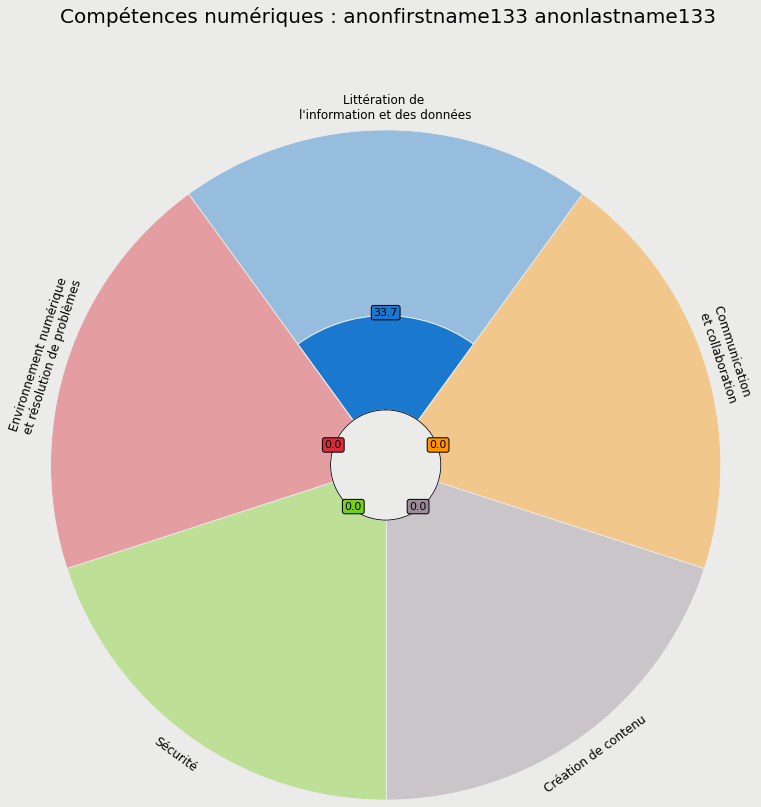

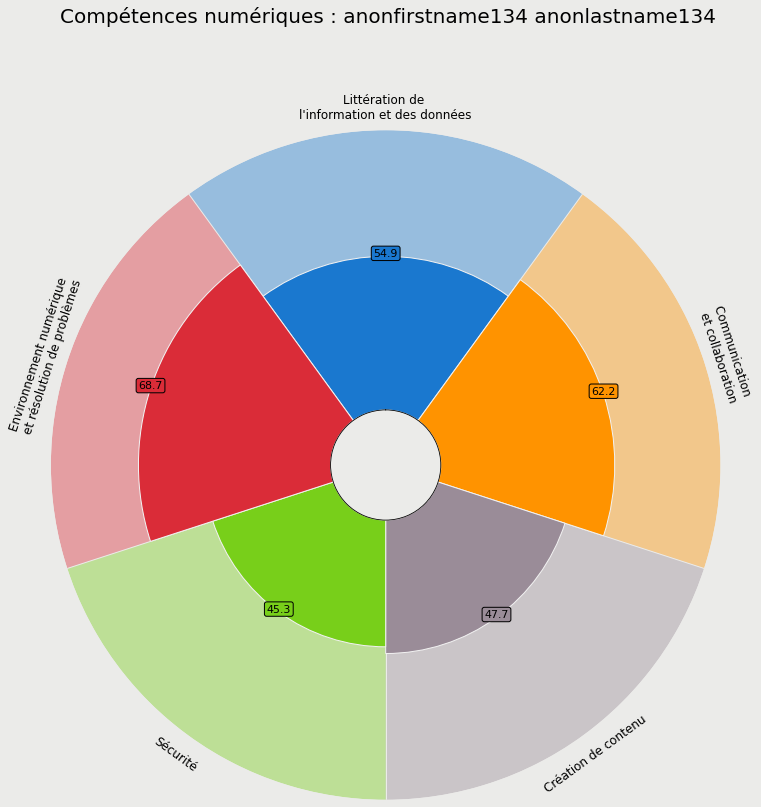

...

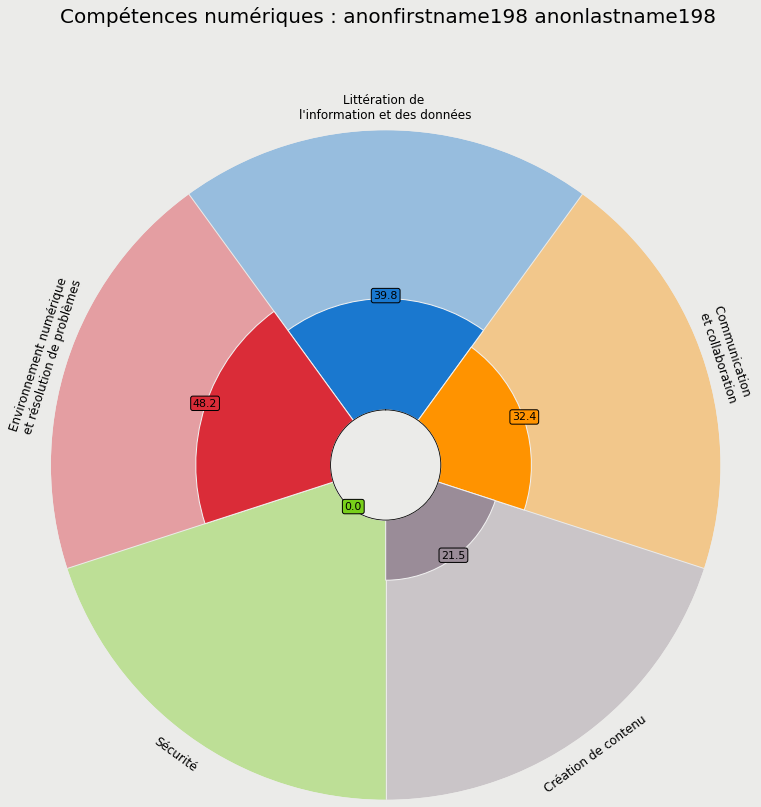

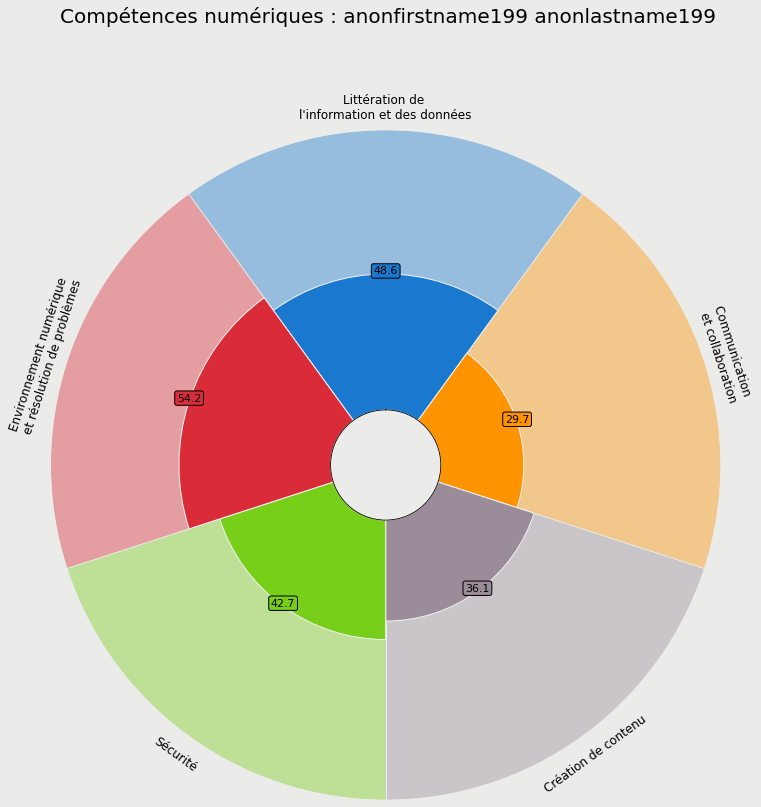

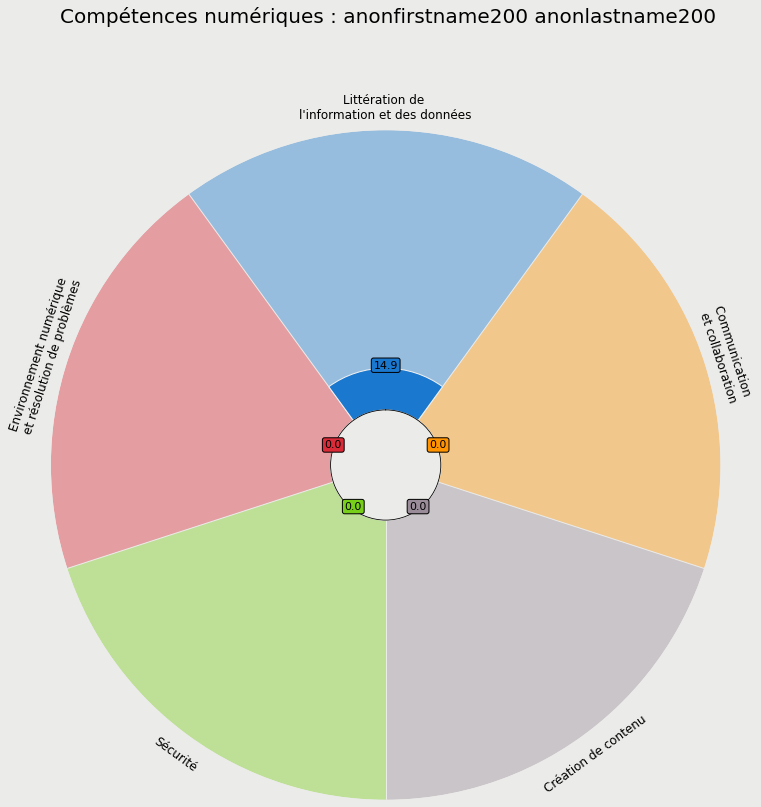

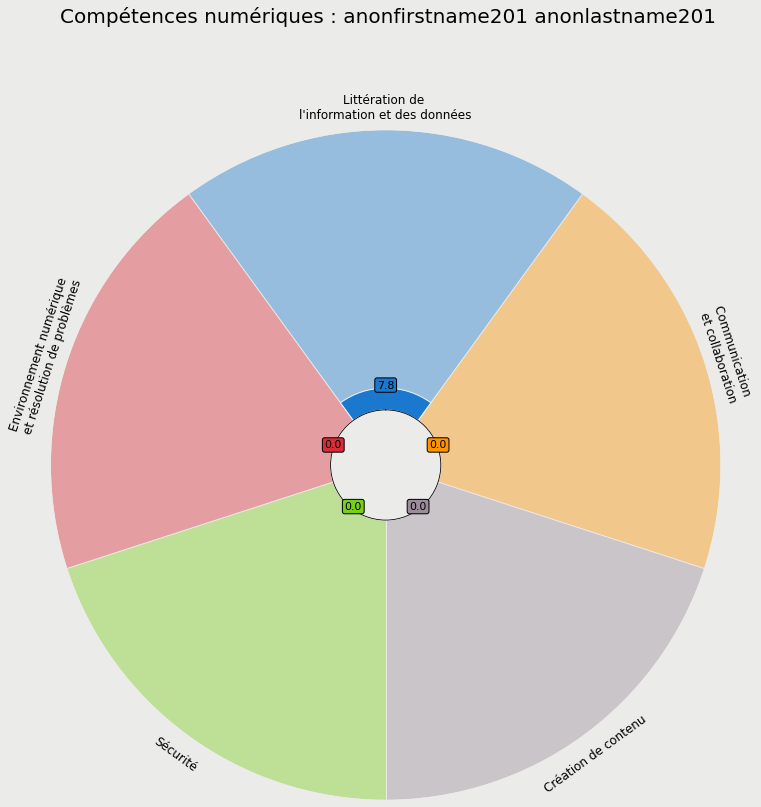

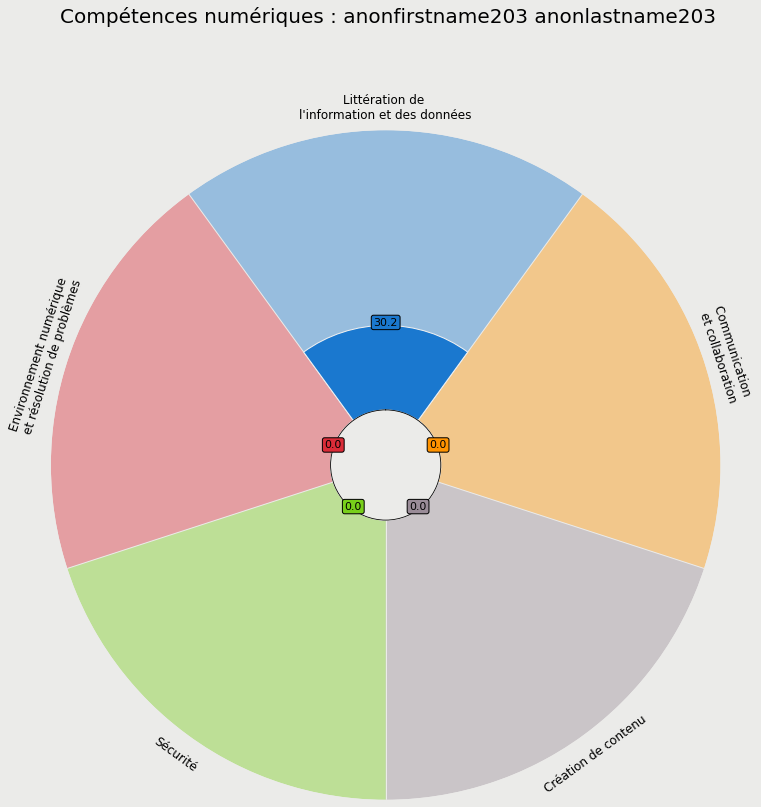

In [6]:
repondants = scoring['Nom.complet'].tolist()

for repondant in repondants:
    vars()[repondant.replace(" ","_")] = scoring.loc[scoring['Nom.complet'] == repondant, 
                                                "domaine_01":'domaine_05'].values.tolist()[0]

domaines = ["Littération de \nl'information et des données",
            'Communication \net collaboration', 
            'Création de contenu', 
            'Sécurité',
            'Environnement numérique \net résolution de problèmes']


# color for the slices and text
slice_colors = ["#1A78CF"] + ["#FF9300"] + ["#9A8C98"] + ["#78cf1a"] + ["#DA2C38"]
text_colors = ["#000000"] * 5
  
min_range = [0, 0, 0, 0, 0]
max_range = [100, 100, 100, 100, 100]

for repondant in repondants:
    scores_repondant = vars()[repondant.replace(" ","_")]
    baker = PyPizza(
        params=domaines,           # list of parameters
        background_color="#EBEBE9",     # background color
        straight_line_color="#EBEBE9",  # color for straight lines
        straight_line_lw=1,             # linewidth for straight lines
        last_circle_lw=0,               # linewidth of last circle
        other_circle_lw=0,              # linewidth for other circles
        inner_circle_size=19.7          # size of inner circle
    )
    fig, ax = baker.make_pizza(
        scores_repondant,
        figsize=(12, 13),                # adjust figsize according to your need
        color_blank_space="same",        # use same color to fill blank space
        slice_colors=slice_colors,       # color for individual slices
        value_colors=text_colors,        # color for the value-text
        value_bck_colors=slice_colors,   # color for the blank spaces
        blank_alpha=0.4,                 # alpha for blank-space colors
        kwargs_slices=dict(
        edgecolor="#F2F2F2", zorder=2, linewidth=1),    # values to be used when plotting slices
        kwargs_params=dict(color="#000000", fontsize=12, va="center"),   # values to be used when adding parameter
        kwargs_values=dict(
            color="#000000", fontsize=11,
            zorder=3,
            bbox=dict(
                edgecolor="#000000", facecolor="cornflowerblue",
                boxstyle="round,pad=0.2", lw=1
            )
        )                                # values to be used when adding parameter-values
    )
    # add title
    fig.text(
        0.515, 0.975, "Compétences numériques : {}".format(repondant), size=20,
        ha="center", color="#000000"
    )  
  
    # export vers fichier Graphs
    plt.savefig(r"C:\Users\HHSS\Graphs/{}.png".format(repondant))
    #plt.show()
    
print("J'ai terminé")